# Test and Tutorial Notebook for Profile Variation Analysis
_Author: Renee Spiewak_

This notebook will demonstrate the key steps of the PCA+GP profile variation analysis through use of a simulated dataset. To simply test the functions, hit the fast-forward button to run all cells and scroll through to check for errors. 


## Outline

1. Producing the dataset - A set of ''observations'' with varying noise (white noise only for now), a phase drift over time, and various types of profile variation are generated automatically. If desired, the ''average profile'' can be generated first and used to produce the ''observations''. 

2. Cleaning and aligning the dataset - Following the exact procedure used for real data, the simulation dataset is cleaned and aligned. The second ''Joy Division''-style waterfall plot should be examined to ensure the alignment of all ''observations''. 

3. Running the PCA - The aligned profiles are passed through a standard PCA tool to extract eigenvectors and eigenvalues. The plot of eigenvalues (for the most significant eigenvectors) over time should be examined for outliers. (Mis-aligned ''observations'' will result in an extraneous eigenvector.) 

4. Running the GPs - The cleaned eigenvalues are passed to a function to determine the GPs using MCMC. For each eigenvalue, a plot of the chain and ''corner'' plot are generated; for this fairly ideal dataset, these should be clean and smooth (e.g., roughly Gaussian distributions in the corner plots). The final best GPs are plotted on top of the eigenvalues for each eigenvector in a summary plot, and the ''reconstructed'' profiles (with the mean subtracted) are shown in a waterfall plot. 



In [1]:
# Jupyter magic to automatically reload specified packages
%load_ext autoreload


In [2]:
import os, sys
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colors as col
import cmasher as cmr
from sklearn.decomposition import PCA
import corner
import george
from george import kernels
import emcee
import scipy.optimize as op
import multiprocessing as mpr
mpr.set_start_method('fork')
import gp_init_threads as th_init
from all_prof_functions import (aligndata, smart_align, calc_snr, plot_joydivision, make_fake_obss,
                                make_fake_profile, add_gauss, do_rem_aln, #check_null_prob,
                                read_pdv, _find_off_pulse, err_eigval, find_eq_width_snr,
                                get_gp, run_each_gp, plot_eig_gp, plot_recon_profs)
try:
    from all_prof_functions import check_null_prob
except ImportError:
    print("Cannot do nulling analysis")
    
#if os.path.exists('../nulling2'):
#    sys.path.append('/home/s86932rs/research/nulling2/')
#    import null2_mcmc as nm
#else

plt.rcParams["figure.figsize"] = (6, 10)

%aimport -os -sys -np -plt -col -cmr -sklearn.decomposition -george -emcee -op -mpr -corner
%autoreload 2


In [3]:
# Set up some plotting stuff
use_bk_bgd = True #### Change this to use white backgrounds for plots  #####
if use_bk_bgd:
    plot_style = 'dark_background'
    # The CMasher package provides lots of lovely colour maps; chroma is a handy sequential cmap
    cmap = cmr.chroma_r
    c1 = cmap(0.0)
    c2 = cmap(0.1)
    c3 = cmap(0.33)
    c4 = cmap(0.55)
    c5 = cmap(0.68)
    c6 = cmap(0.815)

else:
    plot_style = 'default'
    cmap = cmr.chroma
    c1 = cmap(0.0)
    c2 = cmap(0.3)
    c3 = cmap(0.53)
    c4 = cmap(0.65)
    c5 = cmap(0.78)
    c6 = cmap(0.915)


## Simulating a dataset

The real data you will use for the profile variation analysis will contain profiles in a 2D numpy array (phase bins vs. observation number), MJDs in a 1D array, and observation lengths in a 1D array (not used in this version of the analysis pipeline). In order to test the analysis functions, these 3 data products must be simulated. 


### Generating a fake average profile

The ''profiles'' are generated based on an input profile or by adding a number of Gaussian components with white noise. For >1 Gaussian components, the centre bin, width, and amplitude are adjusted using normally- or lognormally-distributed random numbers. For >2 Gaussian components: If `no_ip` is set to False, at least one component will be shifted by `nbin/2` bins, simulating an interpulse. If `no_ip` is set to True, no components will be shifted to form an interpulse (although the normal distribution of phase shifts allows for significant separation of components). 

If you later see that the alignment of profiles is failing, I recommend generating a profile with fewer components, or where the components significantly overlap (i.e., the separation of centre bins is less than the widths). 


In [4]:
# The function to generate an ''average'' profile
make_fake_profile?


Signature: make_fake_profile(ncomp=2, noise_sigma=0.02, nbin=512, no_ip=None)
Docstring:
Produce a fake profile with the given number of Gaussian components
If ncomp > 2, profile may (10% chance) have a main pulse and interpulse
Can also guarantee presence (or absence) of an interpulse

Input:
    ncomp - int, the number of distinct Gaussian components to compose
        the profile
    noise_sigma - float, the ''scale'' of the normal distribution for
        generating white noise on top of the components, relative to
        a profile height of roughly 1;
        `None` indicates a noiseless profile, just the Gaussian components
    nbin - int, the number of phase bins for the profile
    no_ip - bool or None, whether to prohibit or guarantee the presence
        of an interpulse (True/False) or leave it to chance (None)
        
Output:
    a 1D numpy array of length `nbin` representing the profile
    a 1D numpy array of length `ncomp` representing the component centres
    a 1D nu

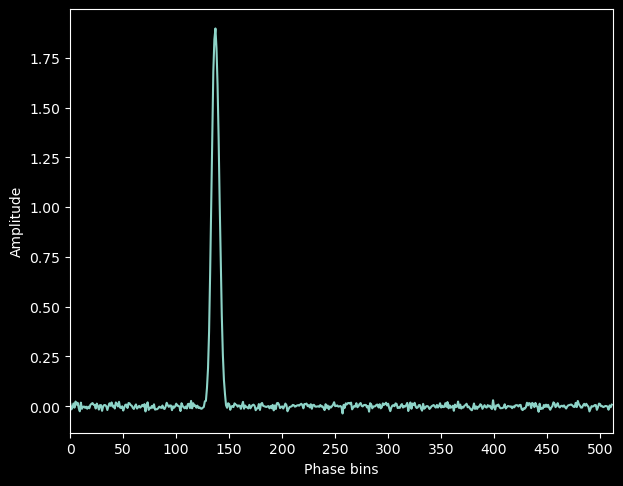

In [5]:
# generate a normal noisy profile but save the parameters to make a noiseless version later
prof, cens, wids, hits = make_fake_profile(4, 0.01, no_ip=True)

with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure(num=1)
    fig.set_size_inches(7, 5.5)
    plt.plot(prof)
    plt.xlim(0, len(prof))
    _ = plt.xticks([i*50 for i in range(1+int(np.floor(len(prof)/50)))])
    plt.xlabel('Phase bins')
    plt.ylabel('Amplitude')
    plt.show()


My initial guess (overestimate) is 20
The number of trials was 41


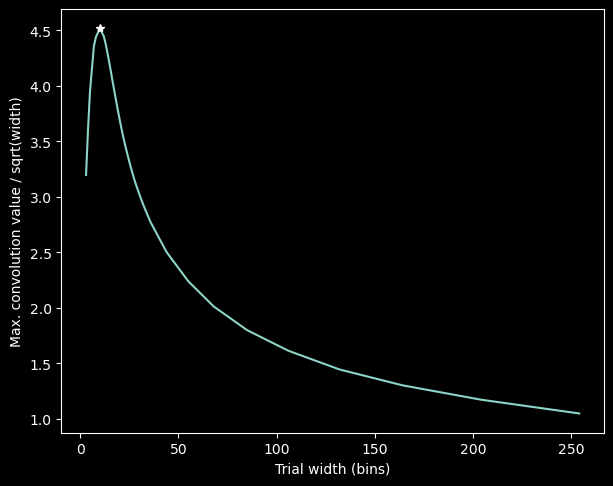

The equivalent width is 10 bins, and the S/N is 434.817


In [6]:
# this cell just demonstrates the method used to find the width of the profile
width, snr = find_eq_width_snr(prof, verb=True, plot_style=plot_style)
print("The equivalent width is {:d} bins, and the S/N is {:.3f}".format(width, snr))


### Simulating a realistic set of observations

The following function attempts to simulate a dataset that is realistic enough to test the PCA and GP parts of this analysis. For each ''observation'':
0. An array of sorted MJD values is generated to represent observation epochs such that `max(mjds) - min(mjds) > nobs*2`, with each successive value separated by at least 0.9 days but no more than `nobs/20`. 

1. A known ''average profile'' can be given (as a numpy array of floats), or a profile will be generated as above with the given number of components and phase bins. WIP: If an ''average profile'' is provided rather than generated inside the function, the shape is treated as single Gaussian for the determination of Gaussian parameters for the next step. 

2. If shape variations is desired: Using the ''average profile'' as a starting point, between 1 and 3 ''eigenvectors'' are produced using a single Gaussian component each, with parameters based on those of the ''average profile'' with random variations. The ''eigenvalues'' are generated for each ''observation'' based on the chosen (or randomly selected) pattern:
    1. Quasi-periodic variations (`qp`) - an offset sinusoid with a timescale between `mjd_range/30` and `mjd_range/10` (i.e., so that between 10 and 30 periods are ''observed'') is used as the base, upon which random variations in both time and amplitude are applied. 
    
    2. Bimodal variations (standard; `bi`) - a boxcar-like function with a timescale between `mjd_range/30` and `mjd_range/5` is used as the base, with the amplitude alternating between 0 and 1 (normal distributions around those values). 
    
    3. Bimodal variations (quick; `bi_quick`) - like the above but with a shorter timescale, chosen from a lognormal distribution with a median value of twice the mean lag between MJDs
    
    4. Random variations (`random`) - with no timescale set, the amplitude of the eigenvalues are simply drawn from a offset lognormal distribution with a median value around 1 (minimum value less than 0, maximum greater than 10)
    
3. An array of ''observation lengths'' is generated using lognormal distribution with a median value of 900s (increased to 3600s for 30\% of ''observations''). The `tobs` values are used to vary the white noise level of the ''observation'', multiplying by `sqrt(tobs_mean/tobs)`. 

4. If nulling is desired: The timescales given (in days) are used to determine whether the ''pulsar'' switches between states, completely independently from any shape variation (i.e., if the ''pulsar'' is ''off'', the output is simply the noise as normal; when ''on'', the full profile with any shape variation is returned). 

5. If desired, a random, small phase shift can be added for successive ''observations'', representing an increasingly incorrent phase solution. This is useful for testing the alignment function. 


The mode is qp with a timescale of 99 days, amplitudes of [0.58205167], and offsets of [0.29102583]


<Figure size 600x1000 with 0 Axes>

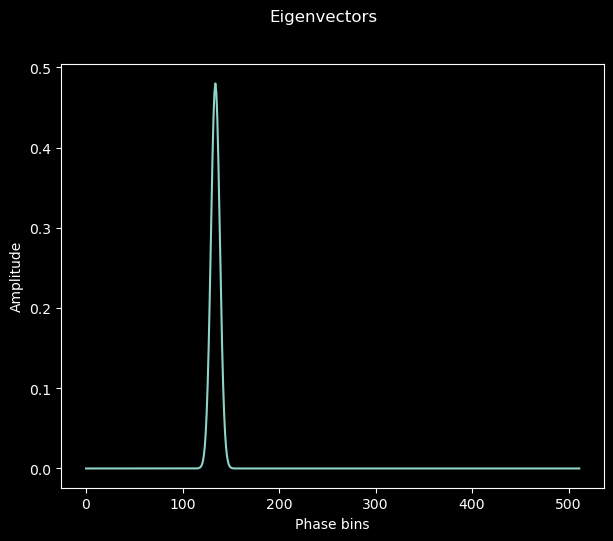

In [11]:
# using a newly-generated average profile with quasi-periodic shape variation, and no nulling or phase misalignment
fakedata, fake_mjds, fake_tobs = make_fake_obss(avg_shape=3, nobs=500, nbin=512, shape_change='qp', null_time=None,
                                                verb=True, plot_style=plot_style, no_misalign=True)

## Uncomment below to generate a different dataset
## using a previously generated profile (noiseless) with nulling and phase misalignment, and no shape variation
#prof_noiseless = np.zeros(512)
#for icomp in range(len(cens)):
#    prof_noiseless = add_gauss(prof_noiseless, cens[icomp], wids[icomp], hits[icomp])

#fakedata, fake_mjds, fake_tobs = make_fake_obss(avg_shape=prof_noiseless, nobs=500, shape_change=False,
#                                                null_time=10, on_time=20, # these values are in days
#                                                verb=False, plot_style=plot_style, no_misalign=False)


<Figure size 600x1000 with 0 Axes>

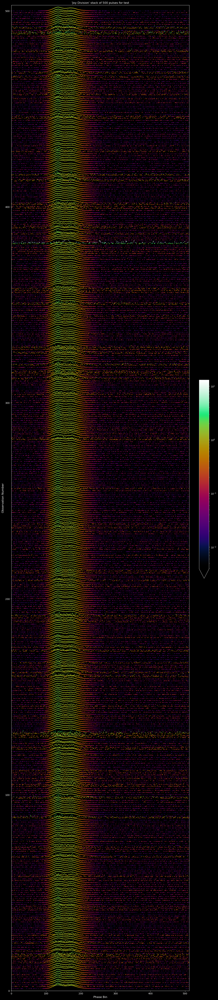

In [12]:
# plot this dataset
plot_joydivision(fakedata, 'test', savename=None, bk_bgd=use_bk_bgd)


<Figure size 600x1000 with 0 Axes>

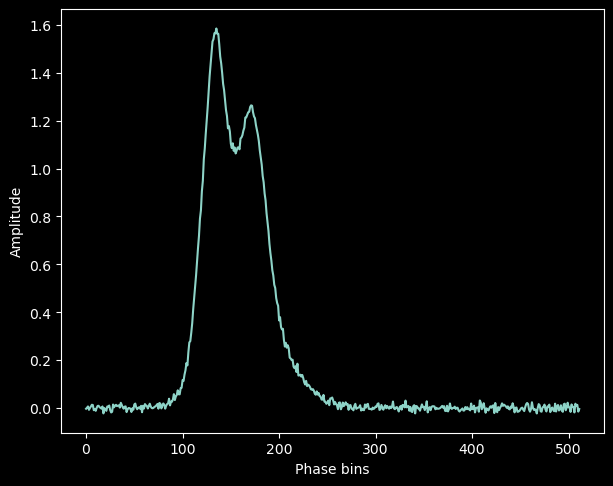

In [13]:
# plot the actual average profile
with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure()
    fig.set_size_inches(7, 5.5)
    plt.plot(np.mean(fakedata, axis=1))
    plt.ylabel('Amplitude')
    plt.xlabel('Phase bins')
    plt.show()
    

## Cleaning and aligning profiles

The cleaning of profiles is done in 3 stages. These, plus the alignment function and normalisation, are performed in a pipeline function `do_rem_aln()`. 

The cleaning stages:
1. Cleaning based on statistics, using `rem_base_outs()` - 3 checks are done on the data, using the off-pulse rms, pulse width, and S/N. For each, a threshold is applied in terms of standard deviations. 
    1. For the off-pulse rms, the cut is `all_rms < rms_med + all_rms.std()*threshold` where `rms_med` is the median off-pulse rms. Note that alignment of the profiles is not guaranteed at this stage, so the rms in several phase windows is compared and the minimum used for this cut. 
    
    1. For pulse width, the cut is `abs(all_wid - wid_men) < wid_thrsh*wid_std`  where `wid_men` is the mean width and `wid_thrsh` is `3.5*threshold` for a broad distribution of pulse widths and `2*threshold` otherwise. 
    
    2. Optional: The cut on S/N is `all_snr > max(snr_med - all_snr[good_snr].std()*threshold, 5)`, where `snr_med` is the median S/N (after trimming failed S/N calculations with the `good_snr` mask), and a standard minimum threshold of S/N \> 5 is applied. 
    
2. A list of known ''bad'' observations can be given using the `bad_mjds` keyword (a list of MJDs); observations with these MJDs are removed after stats-based cleaning. 

3. After the profiles are aligned as described below, a more accurate determination of the off-pulse rms is made, with `rem_extra_noisy()`. For each profile, an iterative function to find the on- and off-pulse regions is run, and the `True` (off-pulse) values are converted to 1s (0s for `False`). These arrays are summed to form an array of length `nbin` containing values from 0 to `nobs`. Bins with values \> `0.6*nobs` are considered the off-pulse region, making a new mask to apply to the profiles. The rms of this region for all profiles is then calculated, and the cut from step 1.A. applied with these values. 

The profiles are aligned using a correlation between a template (the brightest individual profile) and each individual profile (`xcorr = np.correlate(template, obs, "full")`). After this process, a new template is generated (the average profile) and the process repeated, twice. (WIP: if a better template could be provided, some alignment issues with multi-peak profiles could be fixed.) 

Finally, the profiles are normalised by the sum of on-pulse bins (using the aforementioned iterative function to find the off-pulse region). 


In [14]:
# the whole cleaning and aligning pipeline
do_rem_aln?


Signature:
do_rem_aln(
    data_arr,
    mjds_arr,
    tobs_arr,
    thrsh=1.5,
    bad_mjds=None,
    wide=False,
    logg=None,
    cut_snr=False,
)
Docstring:
A pipeline-ish function to remove the baseline, remove bad profiles (including rms outliers and bad MJDs), align the peaks, and make a template.

Input: 
  data_arr : a 2D numpy array of floats with shape (nbin, nprof) representing the input data
  mjds_arr : a 1D numpy array of floats with shape (nprof,) representing MJDs
  tobs_arr : a 1D numpy array of floats with shape (nprof,) representing observation lengths in seconds
  thrsh : float, representing the threshold for trimming outliers based on off-pulse rms
  bad_mjds : list (or numpy array) of floats, representing MJDs to be removed
  wide : bool, whether to assume the distribution of pulse widths is broad (e.g., from shape variation)
  logg : a `logging` object (e.g., from `setup_log()`)
  cut_snr : bool, whether to cut on S/N or leave possible nulls in the dataset
  
O

In [15]:
# run the fake data through the whole cleaning function
fake_aligned, fake_template, fake_mjds_new, _ = do_rem_aln(fakedata, fake_mjds, fake_tobs, thrsh=1.5, cut_snr=False, bad_mjds=None)


Number of noisy profiles removed: 20
In total, removed 65 observations, aligned remaining obs., and normalised according to peak height


<Figure size 600x1000 with 0 Axes>

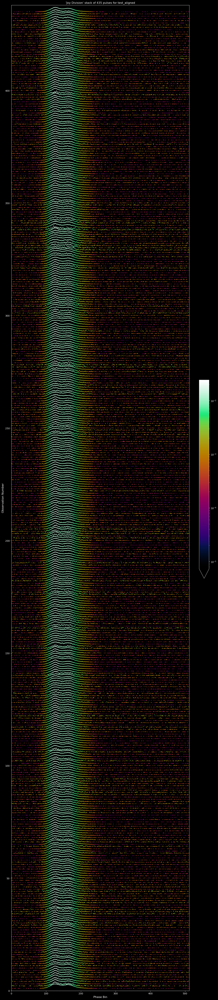

In [16]:
plot_joydivision(fake_aligned, 'test_aligned', savename=None, bk_bgd=use_bk_bgd)


## Running the Principal Component Analysis

### Caveats

PCA is sensitive to misalignment of profiles. Any misaligned profiles will result in one or more extraneous eigenvectors, skewing the analysis and producing outlier eigenvalues, which could cause the GP to fail. You should always check the waterfall plots for misaligned profiles, and then check the eigenvalue plots for significant outliers. The MJDs for any outliers can be given to the `do_rem_aln` function for removal. 

Unless your pulse profile is very wide, it is unwise to include the entire rotation in the PCA as it will look for patterns in the off-pulse which are not relevant to the analysis. Find the rough on-pulse region and make a bin-wise mask (array of booleans). If the profile has an interpulse, that region should be included as well, cutting out any off-pulse region between the MP and IP. 


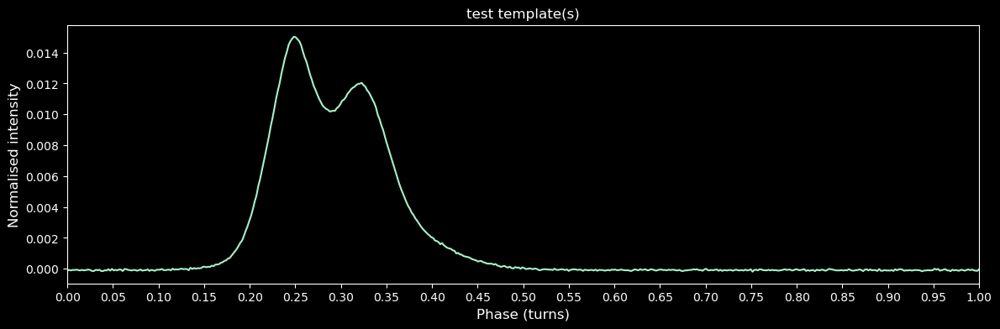

In [17]:
# plot the template to find the on-pulse region
with plt.style.context(plot_style):
    fig = plt.figure(num=1)
    fig.set_size_inches(14, 4)
    plt.title("test template(s)")
    test_nbin = len(fake_template)
    plt.plot(np.linspace(0, 1, test_nbin), fake_template, color=c2)
    plt.xticks(np.linspace(0, 1, 21))
    plt.xlim(0, 1)
    plt.ylabel('Normalised intensity', fontsize=12)
    plt.xlabel('Phase (turns)', fontsize=12)
    plt.show()


In [19]:
# define on-pulse ranges as fractions
ip = False # Change this as necessary
peak_min = 0.1
peak_max = 0.55
off_min = 0.0
off_max = 0.7
ip_min = 0.72
ip_max = 0.79


In [20]:
test_bins = np.linspace(0, 1, num=fake_aligned.shape[0], endpoint=False)
test_mask = np.logical_and(test_bins > off_min, test_bins < off_max)
test_off = np.logical_or(test_bins[test_mask] < peak_min, test_bins[test_mask] > peak_max)
if ip:
    test_mask = np.logical_or(test_mask, np.logical_and(test_bins > ip_min, test_bins < ip_max))
    test_off = np.logical_or(test_bins[test_mask] < peak_min, np.logical_and(test_bins[test_mask] > peak_max, test_bins[test_mask] < off_max))

In [21]:
# test the PCA stuff
test_pca = PCA(n_components=30)
test_comps_all = test_pca.fit_transform(fake_aligned[test_mask,:].T)


<Figure size 600x1000 with 0 Axes>

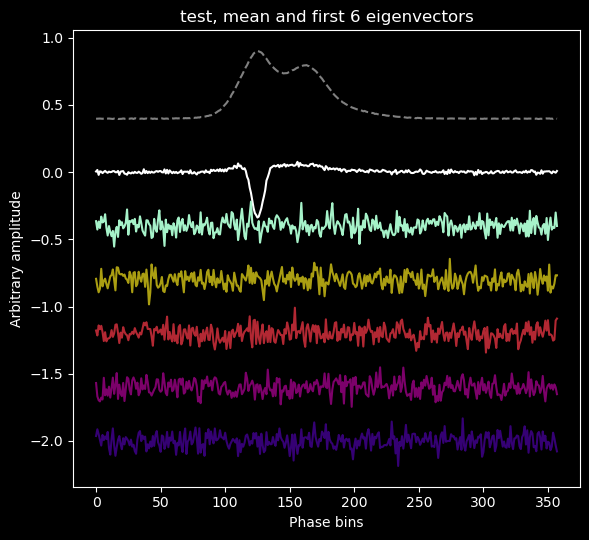

In [22]:
# plot the first five principal components
with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure()
    fig.set_size_inches(6, 5.5)
    plt.title("test, mean and first 6 eigenvectors")
    plt.plot(0.5*(test_pca.mean_/np.max(test_pca.mean_))+0.4, '--', color='grey')
    plt.plot(test_pca.components_[0,:], color=c1)
    plt.plot(test_pca.components_[1,:]-0.4, color=c2)
    plt.plot(test_pca.components_[2,:]-0.8, color=c3)
    plt.plot(test_pca.components_[3,:]-1.2, color=c4)
    plt.plot(test_pca.components_[4,:]-1.6, color=c5)
    plt.plot(test_pca.components_[5,:]-2, color=c6)

    plt.xlabel('Phase bins')
    plt.ylabel('Arbitrary amplitude')
    plt.tight_layout()
    plt.show()


In [35]:
#nums = np.arange(len(fake_aligned[test_mask,0]))
#off_pulse = np.logical_or(nums < 40, nums > 160)
new_errs = err_eigval(fake_aligned[test_mask,:], test_pca.components_, test_off)


<Figure size 600x1000 with 0 Axes>

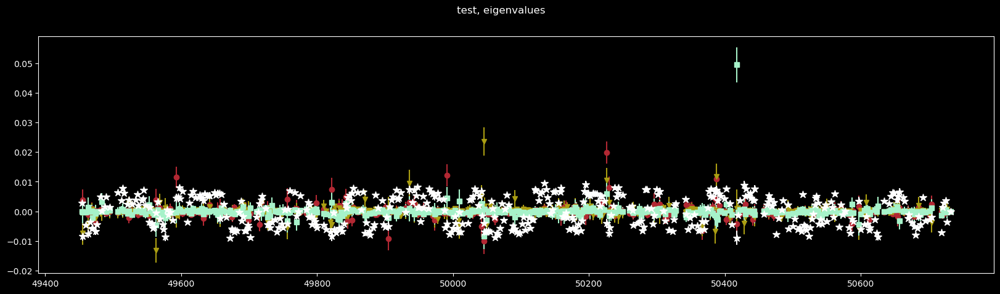

In [36]:
with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure(figsize=(20, 5))
    fig.suptitle("test, eigenvalues")
    ax1 = fig.gca()
    ax1.errorbar(fake_mjds_new, test_comps_all[:,3], yerr=new_errs[:,3], fmt='o', ecolor=c4, mec=c4, mfc=c4)
    ax1.errorbar(fake_mjds_new, test_comps_all[:,2], yerr=new_errs[:,2], fmt='v', ecolor=c3, mec=c3, mfc=c3)
    ax1.errorbar(fake_mjds_new, test_comps_all[:,1], yerr=new_errs[:,1], fmt='s', ecolor=c2, mec=c2, mfc=c2)
    ax1.errorbar(fake_mjds_new, test_comps_all[:,0], yerr=new_errs[:,0], fmt='*', ecolor=c1, mec=c1, mfc=c1, ms=9)
    plt.show()


## Running the Gaussian Process with Markov Chain Monte Carlo

### 


The mean lag between observation epochs is 2.95


<Figure size 600x1000 with 0 Axes>

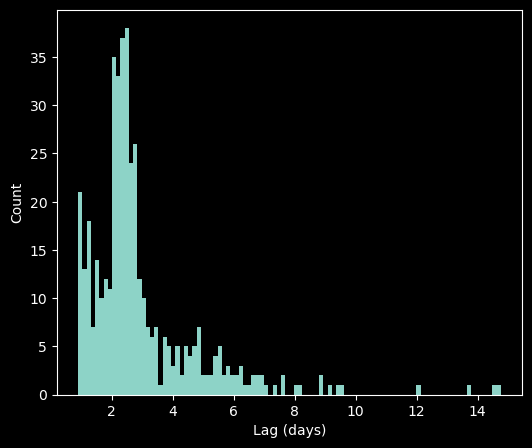

In [25]:
# plot the distribution of lags to ensure the minimum bound on the kernel length is appropriate
with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure()
    fig.set_size_inches(6, 5)
    lags = fake_mjds_new[1:]-fake_mjds_new[:-1]
    _ = plt.hist(lags, bins=100)
    plt.ylabel('Count')
    plt.xlabel('Lag (days)')
    print("The mean lag between observation epochs is {:.2f}".format(np.mean(fake_mjds_new[1:]-fake_mjds_new[:-1])))
    plt.show()


Subtracting 49453 from MJDs (will return true MJD values)
The initial parameter vector is [ -5.52945918 -10.61263126   3.91202301]
Running burn-in


  0%|                                                                                                                                                                                     | 0/3200 [00:00<?, ?it/s]/home/s86932rs/anaconda3/envs/std/lib/python3.10/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3200/3200 [06:05<00:00,  8.77it/s]


Running production chain


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 160000/160000 [2:51:50<00:00, 15.52it/s]


The array of autocorrelation times is [197.5343835  220.91933218 265.91612714]


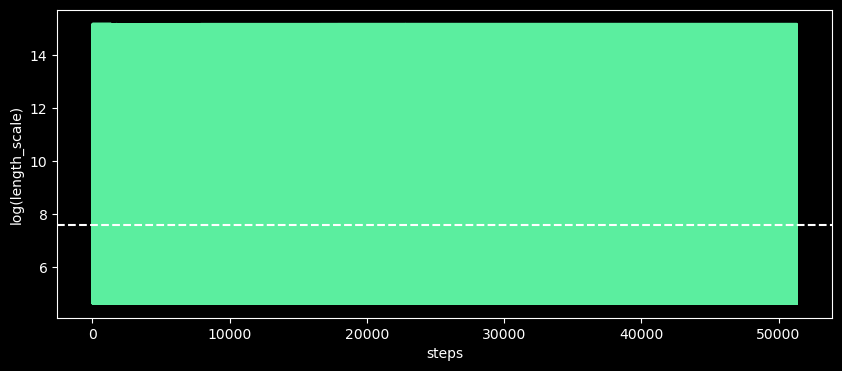

<Figure size 600x1000 with 0 Axes>

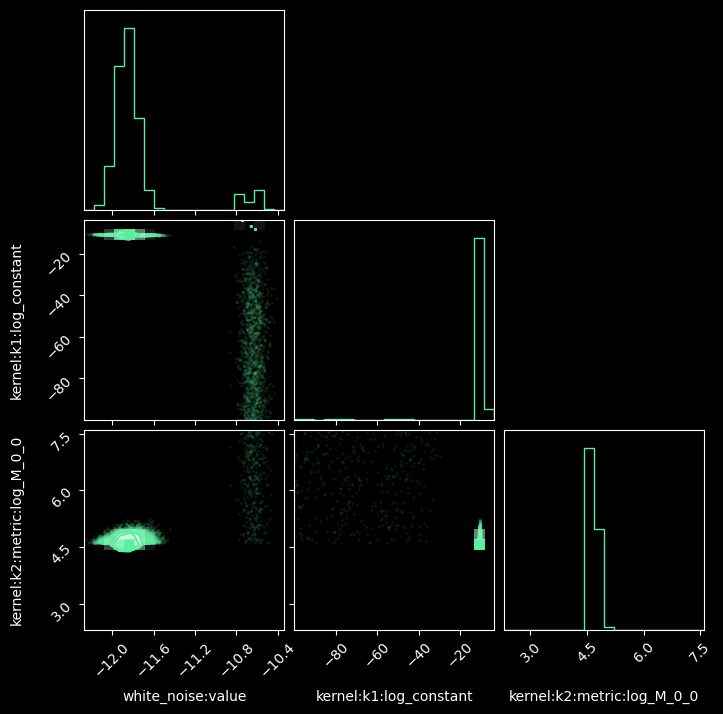

The initial parameter vector is [ -6.17654342 -11.90679973   3.91202301]
Running burn-in


  0%|                                                                                                                                                                                     | 0/3200 [00:00<?, ?it/s]/home/s86932rs/anaconda3/envs/std/lib/python3.10/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2497/3200 [00:46<10:05,  1.16it/s]/home/s86932rs/anaconda3/envs/std/lib/python3.10/site-packages/george/gp.py:330: RuntimeWarning: overflow encountered in exp
  yerr = np.sqrt(self._yerr2 + np.exp(self._call_white_noise(self._x)))
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2514/3200 [01

Running production chain


  2%|███▌                                                                                                                                                                 | 3443/160000 [43:21<32:51:20,  1.32it/s]Process ForkPoolWorker-104:


KeyboardInterrupt



In [37]:
pred_res, pred_vars, mjds_pred = run_each_gp(test_comps_all, fake_mjds_new, new_errs, kern_len=50, max_num=1, prior_min=1e1**2, prior_max=2e3**2,
                                             long=True, plot_chains=True, plot_corner=True, plot_gps=True, mcmc=True, multi=True,
                                             verb=True, bk_bgd=use_bk_bgd)


In [ ]:
plot_recon_profs(test_pca.mean_, test_pca.components_, mjds_pred, pred_res, 'test', mjds_real=fake_mjds_new,
                 sub_mean=True, savename=None, bk_bgd=use_bk_bgd)


## Nulling Analysis



(array([ 7., 16., 20., 28., 40., 44., 46., 42., 39., 47., 42., 40., 35.,
        38., 27., 24., 23., 25., 18., 25., 20., 20., 19., 12., 16.,  9.,
        14.,  8., 11., 20.,  7.,  6.,  7.,  5.,  6.,  4.,  3.,  3.,  2.,
         2.,  2.,  0.,  2.,  0.,  0.,  1.,  0.,  0.,  0.,  2.]),
 array([ 23.80627845,  25.47972329,  27.15316814,  28.82661299,
         30.50005784,  32.17350269,  33.84694754,  35.52039239,
         37.19383724,  38.86728209,  40.54072694,  42.21417179,
         43.88761664,  45.56106149,  47.23450633,  48.90795118,
         50.58139603,  52.25484088,  53.92828573,  55.60173058,
         57.27517543,  58.94862028,  60.62206513,  62.29550998,
         63.96895483,  65.64239968,  67.31584453,  68.98928937,
         70.66273422,  72.33617907,  74.00962392,  75.68306877,
         77.35651362,  79.02995847,  80.70340332,  82.37684817,
         84.05029302,  85.72373787,  87.39718272,  89.07062756,
         90.74407241,  92.41751726,  94.09096211,  95.76440696,
         97.

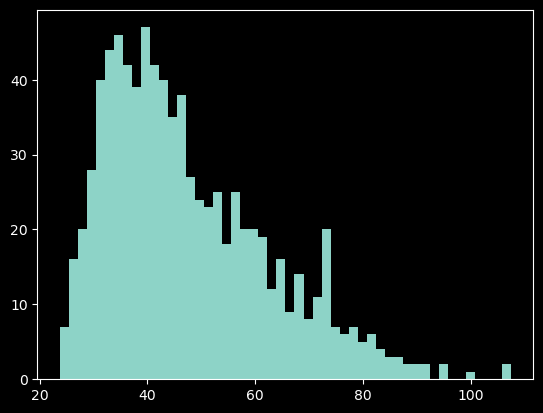

In [166]:
snrs = calc_snr(fake_aligned)
with plt.style.context(plot_style):
    plt.clf()
    fig = plt.figure()
    fig.set_size_inches(6, 5)
    _ = plt.hist(snrs, bins=50)
    plt.ylabel('Counts')
    plt.xlabel('S/N')
    plt.show()


100%|██████████| 500/500 [00:02<00:00, 190.44it/s]


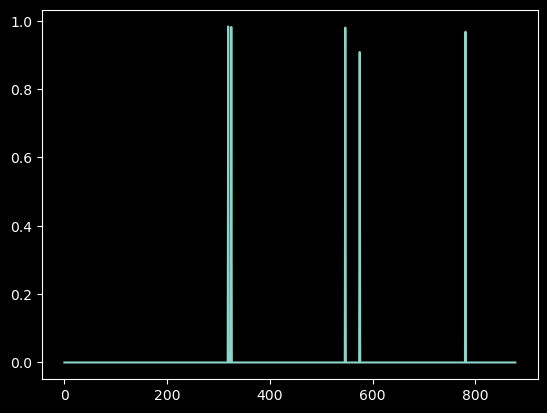

In [681]:
#null_prob = NP.null_probabilities(means_fit, stds_fit, weights_fit, NP.on)
if 'check_null_prob' in globals():
    null_prob = check_null_prob(fake_aligned, peak_bin=128, ip=False, on_min=None, onf_range=None, off_min=None)
    with plt.style.context(plot_style):
        plt.clf()
        fig = plt.figure()
        fig.set_size_inches(6, 5)
        plt.plot(null_prob)
        plt.ylabel('Fractional Probability')
        plt.xlabel('Observation Number')
        plt.show()
